## Setup

Load libraries

In [0]:
# exploration libraries
import seaborn as sns
import matplotlib.pyplot as plt
import pyspark.sql.functions as F
 
# ML libraries
from pyspark.ml import Pipeline
import mlflow
import pyspark.ml.feature as MF
from pyspark.ml.classification import DecisionTreeClassifier, RandomForestClassifier

## Loading the data

In [0]:
FaultDataset=spark.read.csv(
  '/FileStore/tables/FaultDataset.csv',
  sep=',',
  header=True,
  inferSchema=True
)
 
FaultDataset.show(5)

+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+
|        1|        2|        3|        4|        5|        6|        7|        8|        9|       10|       11|       12|       13|       14|       15|       16|       17|       18|       19|       20|fault_detected|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+
|0.3503125|0.3496875|     0.35|0.3459375|   0.3475|0.3459375| 0.341875|0.3434375|    0.355|0.3553125|0.3459375|   0.3525|   0.3575|0.3590625|  0.35875|0.3484375|0.3590625|     0.35|0.3559375|0.3490625|             0|
|0.5090625| 0.484375| 0.046875| 0.071875|     0.06|0.0634375|   0.0575|0.0546875|0.0559375| 0.058125|0.0628125| 0.065625|0.0640625|0

In [0]:
display(FaultDataset)

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0.3503125,0.3496875,0.35,0.3459375,0.3475,0.3459375,0.341875,0.3434375,0.355,0.3553125,0.3459375,0.3525,0.3575,0.3590625,0.35875,0.3484375,0.3590625,0.35,0.3559375,0.3490625,0
0.5090625,0.484375,0.046875,0.071875,0.06,0.0634375,0.0575,0.0546875,0.0559375,0.058125,0.0628125,0.065625,0.0640625,0.0634375,0.0534375,0.084375,0.0615625,0.05375,0.076875,0.056875,0
0.0928125,0.0975,0.1096875,0.1025,0.09625,0.1053125,0.09875,0.098125,0.091875,0.0909375,0.09875,0.103125,0.1,0.1034375,0.1015625,0.0978125,0.0990625,0.10375,0.098125,0.1040625,0
0.09375,0.089375,0.091875,0.0996875,0.0909375,0.096875,0.0940625,0.096875,0.096875,0.099375,0.099375,0.0959375,0.0959375,0.0940625,0.09125,0.0996875,0.09375,0.0934375,0.0971875,0.094375,0
0.036875,0.0440625,0.038125,0.0428125,0.0353125,0.0340625,0.033125,0.0403125,0.0346875,0.036875,0.035625,0.03625,0.0409375,0.039375,0.035,0.040625,0.0384375,0.036875,0.04,0.0371875,0
0.135625,0.3034375,0.13875,0.140625,0.126875,0.130625,0.139375,0.143125,0.1290625,0.140625,0.1340625,0.1396875,0.1384375,0.1453125,0.1453125,0.1496875,0.1440625,0.1359375,0.1453125,0.14625,0
0.3446875,0.35125,0.3353125,0.3471875,0.34625,0.348125,0.3478125,0.3521875,0.3525,0.35125,0.3571875,0.360625,0.3640625,0.36625,0.3640625,0.3634375,0.3475,0.35375,0.1575,0.351875,0
0.036875,0.035625,0.03125,0.0375,0.0390625,0.034375,0.0315625,0.031875,0.0378125,0.0321875,0.0371875,0.038125,0.035,0.0353125,0.0325,0.03,0.0325,0.0321875,0.0321875,0.03125,0
0.0371875,0.039375,0.033125,0.04,0.04125,0.03875,0.035625,0.0384375,0.0378125,0.0365625,0.033125,0.0365625,0.03375,0.034375,0.0346875,0.04125,0.0365625,0.035,0.034375,0.0396875,0
0.3590625,0.3609375,0.360625,0.3590625,0.355,0.365,0.355625,0.358125,0.3575,0.3578125,0.355625,0.3584375,0.3521875,0.3459375,0.3521875,0.3509375,0.3525,0.35625,0.353125,0.3540625,0


#Exploratory Data Analysis

In [0]:
FaultDataset.printSchema()

root
 |-- 1: double (nullable = true)
 |-- 2: double (nullable = true)
 |-- 3: double (nullable = true)
 |-- 4: double (nullable = true)
 |-- 5: double (nullable = true)
 |-- 6: double (nullable = true)
 |-- 7: double (nullable = true)
 |-- 8: double (nullable = true)
 |-- 9: double (nullable = true)
 |-- 10: double (nullable = true)
 |-- 11: double (nullable = true)
 |-- 12: double (nullable = true)
 |-- 13: double (nullable = true)
 |-- 14: double (nullable = true)
 |-- 15: double (nullable = true)
 |-- 16: double (nullable = true)
 |-- 17: double (nullable = true)
 |-- 18: double (nullable = true)
 |-- 19: double (nullable = true)
 |-- 20: double (nullable = true)
 |-- fault_detected: integer (nullable = true)



In [0]:
# check missing observation
 
(
  FaultDataset
  .select(
    [
      F.count(F.when(F.isnan(c) | F.col(c).isNull(), c))
      .alias(c)
      for c in FaultDataset.columns
    ]
  )
).show()

+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+
|  1|  2|  3|  4|  5|  6|  7|  8|  9| 10| 11| 12| 13| 14| 15| 16| 17| 18| 19| 20|fault_detected|
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+
|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|             0|
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+



In [0]:
FaultDataset.select(F.count(F.when(F.isnan('fault_detected') |  F.col('fault_detected').isNull(), 'fault_detected')).alias('fault_detected')).show()

+--------------+
|fault_detected|
+--------------+
|             0|
+--------------+



In [0]:
## Checking the distribution of Fault Detected (outcome/response) Column
(
  FaultDataset.groupBy('fault_detected')
  .count()
  .show()
)

+--------------+-----+
|fault_detected|count|
+--------------+-----+
|             1| 4646|
|             0| 4646|
+--------------+-----+



In [0]:
(
  FaultDataset.groupBy('fault_detected')
  .count()
  .withColumn('percentage', F.col('count')/FaultDataset.count())
  .show()
)

+--------------+-----+----------+
|fault_detected|count|percentage|
+--------------+-----+----------+
|             1| 4646|       0.5|
|             0| 4646|       0.5|
+--------------+-----+----------+



#Descriptive Statistics

In [0]:
display(FaultDataset.drop('fault_detected').describe())

summary,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
count,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292,9292
mean,0.34162330499354226,0.34263116121394677,0.3421213812957383,0.34213907124407966,0.3428434405940584,0.3428279366659492,0.3427147008179088,0.34306577566724017,0.34317299155187225,0.3439251842983209,0.3441075320167876,0.34398424047567727,0.3441183275936292,0.3448787599547991,0.34489994753551373,0.3458342525828662,0.34563488753766686,0.3457525290572536,0.3465221427034015,0.346670724817048
stddev,0.28919489486260785,0.2890875372793958,0.28916422490616933,0.28916356333107296,0.2889646554403878,0.2890889899729543,0.2891948159883224,0.28919185608065456,0.2893401858067147,0.289011538534877,0.28920014487495876,0.2890708129465896,0.28911804701463106,0.2889821392646809,0.2891314011350137,0.2888285654988746,0.28892040336707314,0.28915028148431343,0.2887705775702368,0.28900135543931055
min,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.024375,0.025,0.025,0.025,0.024375,0.024375,0.024375,0.024375,0.025
max,1.0809375,1.2134375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.2134375,1.0809375,1.2134375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375,1.0809375


In [0]:
data_pandas=FaultDataset.toPandas()
 
data_pandas.drop('fault_detected', axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
1,9292.0,0.341623,0.289195,0.024375,0.064062,0.342187,0.618437,1.080938
2,9292.0,0.342631,0.289088,0.024375,0.064609,0.343750,0.619062,1.213437
3,9292.0,0.342121,0.289164,0.024375,0.064375,0.342813,0.619062,1.080938
4,9292.0,0.342139,0.289164,0.024375,0.064375,0.342031,0.619062,1.080938
5,9292.0,0.342843,0.288965,0.024375,0.065000,0.343594,0.619062,1.080938
6,9292.0,0.342828,0.289089,0.024375,0.065000,0.343750,0.619062,1.080938
7,9292.0,0.342715,0.289195,0.024375,0.064687,0.342813,0.619141,1.080938
8,9292.0,0.343066,0.289192,0.024375,0.065312,0.343125,0.619687,1.080938
9,9292.0,0.343173,0.289340,0.024375,0.065000,0.342813,0.619766,1.080938
10,9292.0,0.343925,0.289012,0.024375,0.065937,0.345000,0.620000,1.080938


#Data visualization

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

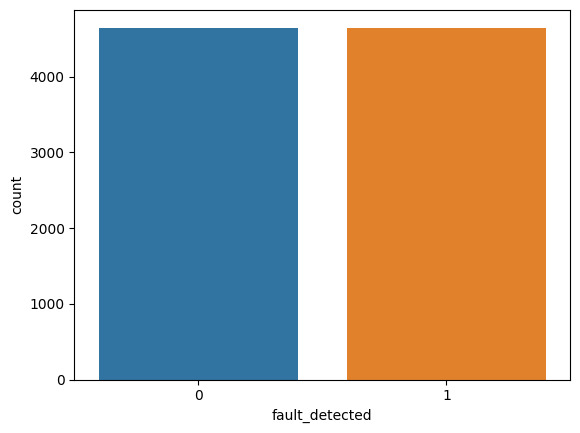

In [0]:
sns.countplot(x='fault_detected', data=data_pandas)
plt.show()

<AxesSubplot:>

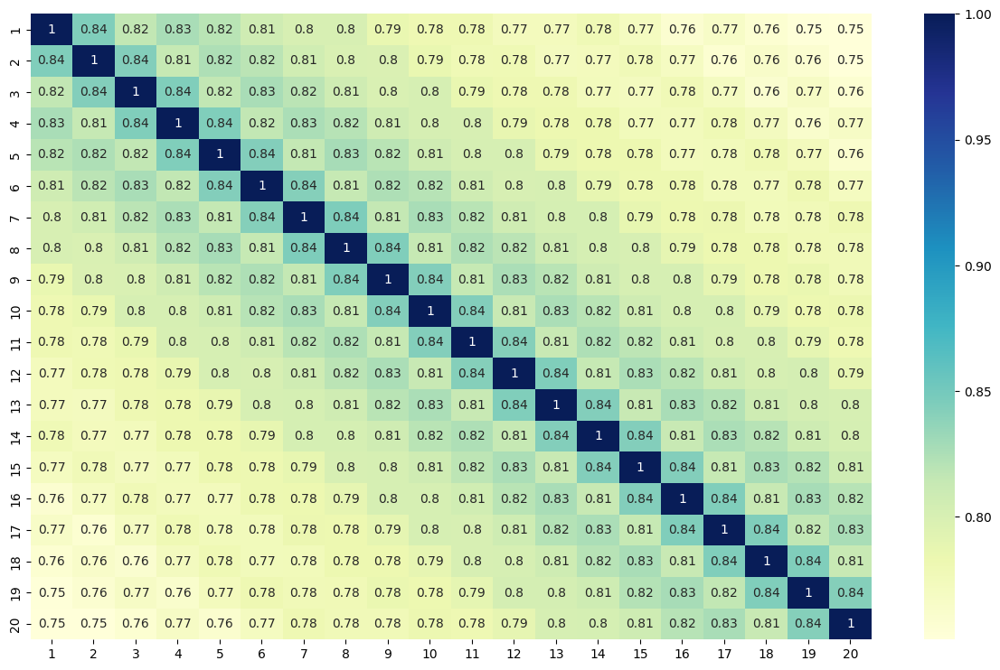

In [0]:
plt.figure(figsize=(15,9))
sns.heatmap(data_pandas.drop('fault_detected', axis=1).corr(), cmap='YlGnBu', annot=True)

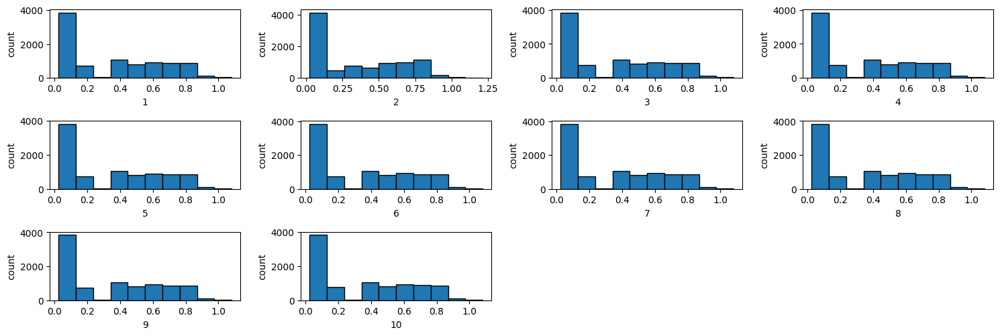

In [0]:
plt.figure(figsize=(15,8))
 
for j in range(10):
  plt.subplot(5, 4, j+1)
  plt.hist(data_pandas.iloc[:,j], edgecolor='black')
  plt.xlabel(data_pandas.columns[j], fontsize=10)
  plt.ylabel('count')
plt.tight_layout()
plt.show()

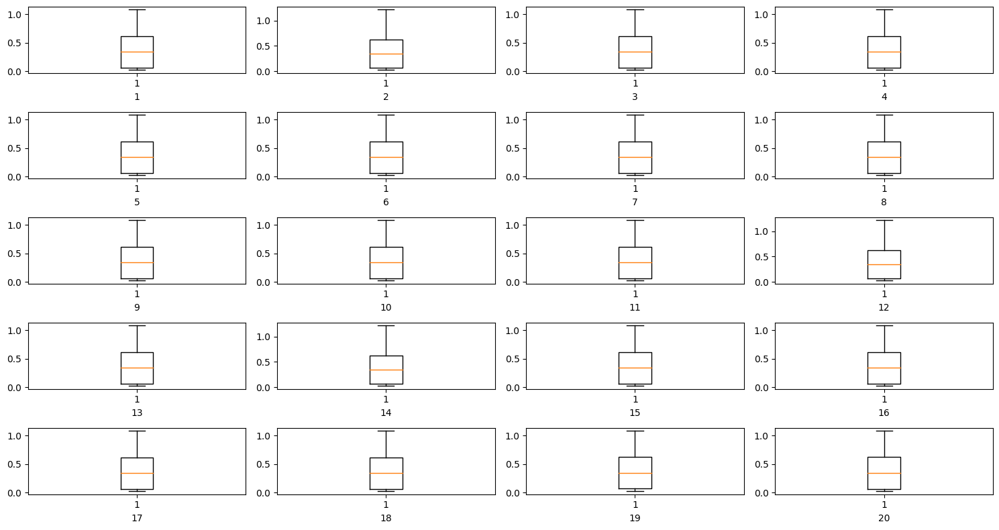

In [0]:
plt.figure(figsize=(15,8))
 
for j in range(20):
  plt.subplot(5, 4, j+1)
  plt.boxplot(data_pandas.iloc[:,j])
  plt.xlabel(data_pandas.columns[j], fontsize=10)
  #plt.ylabel('count')
plt.tight_layout()
plt.show()

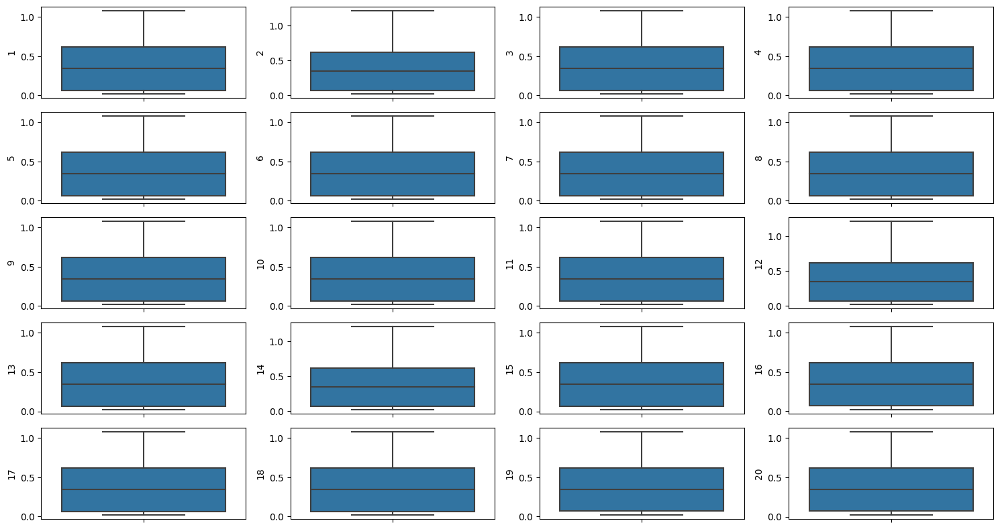

In [0]:
plt.figure(figsize=(15,8))
 
for j in range(20):
  plt.subplot(5, 4, j+1)
  sns.boxplot(y=data_pandas.columns[j], data=data_pandas)
 # plt.xlabel(data_pandas.columns[j], fontsize=10)
  #plt.ylabel('count')
plt.tight_layout()
plt.show()

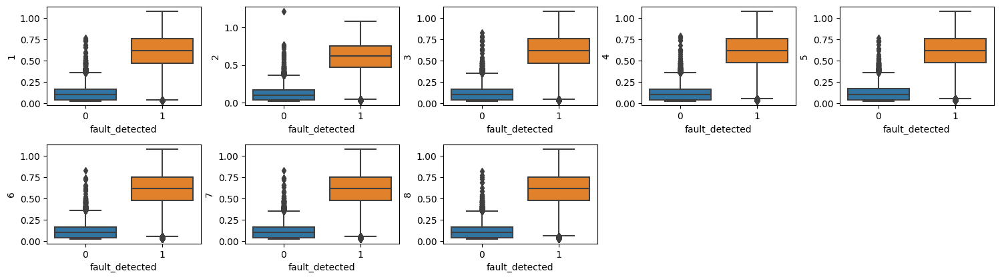

In [0]:
plt.figure(figsize=(15,8))
 
for j in range(8):
  plt.subplot(4, 5, j+1)
  sns.boxplot(y=data_pandas.columns[j], data=data_pandas, x='fault_detected')
 # plt.xlabel(data_pandas.columns[j], fontsize=10)
  #plt.ylabel('count')
plt.tight_layout()
plt.show()

#Train-test Split

In [0]:
from pyspark.ml import Pipeline
import mlflow
import pyspark.ml.feature as MF
from pyspark.ml.classification import DecisionTreeClassifier

In [0]:
mlflow.pyspark.ml.autolog()

In [0]:
train, test=FaultDataset.randomSplit(weights=[0.5, 0.3], seed=35)

print("Training count Dataset: " + str(train.count()))
print("Test count Dataset: " + str(test.count()))

Training count Dataset: 5835
Test count Dataset: 3457


In [0]:
features = MF.VectorAssembler(
  inputCols=FaultDataset.columns[:-1],
  outputCol='features'
)
 
scaler = MF.StandardScaler(
  inputCol='features',
  outputCol='scaled_features'
)

In [0]:
display(scaler.fit(features.transform(train)).transform(features.transform(train)))

2023/04/28 12:39:57 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'c64a21b50ef4428ab13f012d3db92411', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow


1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected,features,scaled_features
0.024375,0.03,0.03375,0.02625,0.0334375,0.0271875,0.0275,0.02625,0.034375,0.0321875,0.031875,0.031875,0.0346875,0.0340625,0.0303125,0.03375,0.03125,0.0290625,0.0325,0.0328125,1,"Map(vectorType -> dense, length -> 20, values -> List(0.024375, 0.03, 0.03375, 0.02625, 0.0334375, 0.0271875, 0.0275, 0.02625, 0.034375, 0.0321875, 0.031875, 0.031875, 0.0346875, 0.0340625, 0.0303125, 0.03375, 0.03125, 0.0290625, 0.0325, 0.0328125))","Map(vectorType -> dense, length -> 20, values -> List(0.08446986017386768, 0.103954315537546, 0.11694831131739006, 0.09091874796863758, 0.11565537345033657, 0.09393363180706156, 0.0948707328252231, 0.0908774082106919, 0.11882787879683478, 0.1112883428280869, 0.1102978493281907, 0.11035512588697596, 0.120133509668628, 0.11789249635750206, 0.10491484119850453, 0.11660774820368013, 0.10819724782129259, 0.10035604444794004, 0.11268343775837272, 0.11354116679725437))"
0.025,0.0334375,0.035625,0.02875,0.0334375,0.03,0.030625,0.026875,0.02875,0.0359375,0.035,0.03875,0.034375,0.9184375,0.873125,0.8878125,0.8090625,0.033125,0.7809375,0.77875,1,"Map(vectorType -> dense, length -> 20, values -> List(0.025, 0.0334375, 0.035625, 0.02875, 0.0334375, 0.03, 0.030625, 0.026875, 0.02875, 0.0359375, 0.035, 0.03875, 0.034375, 0.9184375, 0.873125, 0.8878125, 0.8090625, 0.033125, 0.7809375, 0.77875))","Map(vectorType -> dense, length -> 20, values -> List(0.08663575402447968, 0.11586574752622317, 0.12344543972391171, 0.09957767634660308, 0.11565537345033657, 0.10365090406296447, 0.10565149791899844, 0.09304115602523219, 0.09938331681189817, 0.12425397500223294, 0.1211113639682094, 0.1341572118625982, 0.11905122579773945, 3.1787710715109956, 3.021980065037337, 3.067431598580141, 2.801226746093265, 0.11438430872560908, 2.707652989982437, 2.694710358654837))"
0.0253125,0.0259375,0.0284375,0.0296875,0.0340625,0.0328125,0.0328125,0.0325,0.025,0.0334375,0.035625,0.02875,0.0334375,0.03,0.030625,0.026875,0.02875,0.0359375,0.035,0.03875,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0253125, 0.0259375, 0.0284375, 0.0296875, 0.0340625, 0.0328125, 0.0328125, 0.0325, 0.025, 0.0334375, 0.035625, 0.02875, 0.0334375, 0.03, 0.030625, 0.026875, 0.02875, 0.0359375, 0.035, 0.03875))","Map(vectorType -> dense, length -> 20, values -> List(0.08771870094978568, 0.08987716864183665, 0.09853978083224532, 0.10282477448834013, 0.11781715613165127, 0.1133681763188674, 0.1131980334846412, 0.11251488635609475, 0.0864202754886071, 0.11561022021946893, 0.12327406689621312, 0.09953599589805674, 0.11580437418507383, 0.103831923397433, 0.10599643749952005, 0.09285431801404158, 0.09954146799558919, 0.12409618399476455, 0.12135139450901679, 0.13408671126532898))"
0.0259375,0.0278125,0.0271875,0.0365625,0.03,0.02875,0.0265625,0.02875,0.0321875,0.0290625,0.0271875,0.0265625,0.0296875,0.0278125,0.0284375,0.0271875,0.0284375,0.0309375,0.0309375,0.02875,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0259375, 0.0278125, 0.0271875, 0.0365625, 0.03, 0.02875, 0.0265625, 0.02875, 0.0321875, 0.0290625, 0.0271875, 0.0265625, 0.0296875, 0.0278125, 0.0284375, 0.0271875, 0.0284375, 0.0309375, 0.0309375, 0.02875))","Map(vectorType -> dense, length -> 20, values -> List(0.08988459480039765, 0.09637431336293328, 0.0942083618945642, 0.12663682752774522, 0.10376556870310569, 0.0993321163936743, 0.09163650329709049, 0.09953239946885305, 0.11126610469158164, 0.10048364934963187, 0.09407757736816265, 0.09196260490581329, 0.10281696773441133, 0.09626084564970351, 0.09842526339241148, 0.09393401938629788, 0.09845949551737626, 0.10683062796071036, 0.1072659647892202, 0.09948368900330859))"
0.0259375,0.0284375,0.0296875,0.0340625,0.0328125,0.0328125,0.0325,0.025,0.0334375,0.035625,0.02875,0.0334375,0.03,0.030625,0.026875,0.02875,0.0359375,0.035,0.03875,0.034375,1,"Map(vectorType -> dense, length -> 20, values -> List(0.0259375, 0.0284375, 0.0296875, 0.0340625, 0.0328125, 0.03

In [0]:
scaled=scaler.fit(features.transform(train))
scaled_train=scaled.transform(features.transform(train))
scaled_test=scaled.transform(features.transform(test))

2023/04/28 11:41:03 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'dcb5f34f729d4369bd00fff62ef83ef8', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow


In [0]:
DTC = DecisionTreeClassifier(
  featuresCol='scaled_features', labelCol='fault_detected',
  predictionCol='prediction',
  maxDepth=20, seed=42
)
model=DTC.fit(scaled_train)

2023/04/28 11:41:06 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'ab1147ec8d28458aa1749b8932544568', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 11:41:16 WARNING mlflow.pyspark.ml: Model inputs contain unsupported Spark data types: [StructField('features', VectorUDT(), True), StructField('scaled_features', VectorUDT(), True)]. Model signature is not logged.
2023/04/28 11:41:25 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 11:42:17 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/databricks/python/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils."


In [0]:
Pred_DT=model.transform(scaled_test)

In [0]:
res_Table =(
  Pred_DT
  .select("fault_detected","prediction", "probability")
  .withColumn('fault_detected', F.col('fault_detected').cast('float'))
)
 
res_Table.show(4, False)

+--------------+----------+-----------+
|fault_detected|prediction|probability|
+--------------+----------+-----------+
|1.0           |1.0       |[0.0,1.0]  |
|1.0           |1.0       |[0.0,1.0]  |
|0.0           |1.0       |[0.0,1.0]  |
|1.0           |1.0       |[0.0,1.0]  |
+--------------+----------+-----------+
only showing top 4 rows



##Evaluate Model on Testing Set

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

In [0]:
evaluator=MulticlassClassificationEvaluator(labelCol='fault_detected', predictionCol='prediction', metricName='accuracy')
 
acc_DT=evaluator.evaluate(Pred_DT)
acc_DT
Out[47]: 0.970391061452514


In [0]:
f1_dt=evaluator.evaluate(Pred_DT, {evaluator.metricName: "f1"})
f1_dt

0.9703912000678954

## Hyperparameter Optimization

In [0]:
from pyspark.ml.tuning import ParamGridBuilder
 
param_grid = (
  ParamGridBuilder()
  .addGrid(DTC.impurity, ['gini', 'entropy'])
  .addGrid(DTC.maxDepth, [5, 7, 20])
  .addGrid(DTC.maxBins, [32, 16, 8])
  .build()
)


In [0]:
from pyspark.ml.tuning import TrainValidationSplit
 
 
tvs = (
  TrainValidationSplit()
  .setSeed(42)
  .setTrainRatio(0.8)
  .setEstimatorParamMaps(param_grid)
  .setEstimator(DTC)
  .setEvaluator(evaluator)
)

In [0]:
GS = tvs.fit(scaled_train)

2023/04/28 11:42:24 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '3fea5de3460347c2889f4c3c3f874bac', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 11:43:54 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 11:44:57 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
bestModel=GS.bestModel
 
print(f'Best Impurity Measure: {bestModel.getImpurity()}')
print(f'Best Max Bin Measure: {bestModel.getMaxBins()}')
print(f'Best Max Depth Measure: {bestModel.getMaxDepth()}')


Best Impurity Measure: entropy
Best Max Bin Measure: 32
Best Max Depth Measure: 20


In [0]:
evaluator.evaluate(bestModel.transform(scaled_test))


0.9597765363128492

##RF

In [0]:
RFC = RandomForestClassifier(
  featuresCol='scaled_features', labelCol='fault_detected',
  predictionCol='prediction',
  maxDepth=20, seed=42, numTrees=50, featureSubsetStrategy='auto'
)

modelRF=RFC.fit(scaled_train)


2023/04/28 11:45:53 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '3f13f50a815d432486d9f1509c416772', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 11:46:23 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 11:47:32 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/1802369882595707/3f13f50a815d432486d9f1509c416772/artifacts/model/sparkml, flavor: spark), fall back to return ['pyspark==3.4.0']. Set logging level to DEBUG to see the full traceback.


In [0]:
Pred_RF=modelRF.transform(scaled_test)

In [0]:
acc_RF=evaluator.evaluate(Pred_RF)
acc_RF

0.9731843575418995

In [0]:
f1_rf=evaluator.evaluate(Pred_RF, {evaluator.metricName: "f1"})
f1_rf

0.9731841901533698

In [0]:
data =[
  ('DT', acc_DT, f1_dt),
  ('RF', acc_RF, f1_rf)
]
 
results=spark.createDataFrame(data, ['Model', 'Accuracy', 'F1'])
results.show()

+-----+------------------+------------------+
|Model|          Accuracy|                F1|
+-----+------------------+------------------+
|   DT| 0.970391061452514|0.9703912000678954|
|   RF|0.9731843575418995|0.9731841901533698|
+-----+------------------+------------------+

